## Init

In [1]:
import numpy as np
import pandas as pd
import os
from IPython.display import Audio, display

from pydub import AudioSegment
from pyannote.core import Timeline, Segment
from pyannote.audio import Pipeline
from asteroid.models import ConvTasNet
import torch, torchaudio

c:\Users\conno\Desktop\UoB_Project\cxb1114\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Overlapped Speech Detection

In [ ]:
from pyannote.audio import Pipeline
ovl_model = Pipeline.from_pretrained("pyannote/overlapped-speech-detection",
                                    use_auth_token="ACCESS_TOKEN_GOES_HERE")

print(ovl_model.sample  # usually 16000
print(ovl_model.mono)         # usually True


c:\Users\conno\Desktop\UoB_Project\cxb1114\.venv\lib\site-packages\pytorch_lightning\utilities\migration\migration.py:208: You have multiple `ModelCheckpoint` callback states in this checkpoint, but we found state keys that would end up colliding with each other after an upgrade, which means we can't differentiate which of your checkpoint callbacks needs which states. At least one of your `ModelCheckpoint` callbacks will not be able to reload the state.
Lightning automatically upgraded your loaded checkpoint from v1.1.3 to v2.5.2. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint C:\Users\conno\.cache\torch\pyannote\models--pyannote--segmentation\snapshots\059e96f964841d40f1a5e755bb7223f76666bba4\pytorch_model.bin`


Model was trained with pyannote.audio 0.0.1, yours is 3.3.2. Bad things might happen unless you revert pyannote.audio to 0.x.
Model was trained with torch 1.7.1, yours is 2.6.0+cpu. Bad things might happen unless you revert torch to 1.x.


AttributeError: 'OverlappedSpeechDetection' object has no attribute 'sample_rate'

Overlapped speech from 0.0s to 1.7s


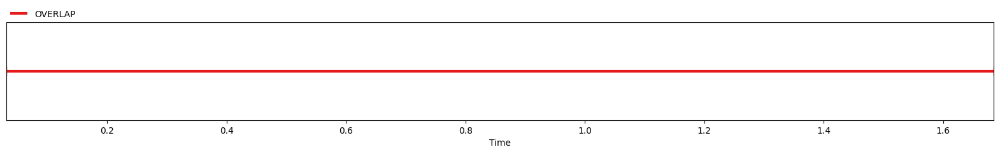

In [15]:
file_path = r"data\libricss\OV40\overlap_ratio_40.0_sil0.1_1.0_session0_actual39.5\record\utterances\utterance_4.wav"

output = ovl_model(file_path)

display(Audio(file_path))

for speech in output.get_timeline().support():
    print(f"Overlapped speech from {speech.start:.1f}s to {speech.end:.1f}s")

output

In [16]:
file_path = r"data\libricss\OV40\overlap_ratio_40.0_sil0.1_1.0_session0_actual39.5\record\utterances\utterance_1.wav"

output = ovl_model(file_path)

display(Audio(file_path))

for speech in output.get_timeline().support():
    print(f"Overlapped speech from {speech.start:.1f}s to {speech.end:.1f}s")

Overlapped speech from 3.6s to 4.6s


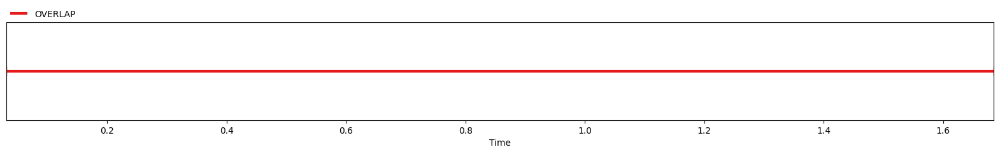

In [13]:
output

## Speaker diarisation
**"Who said that?"**

For speaker diarization; doesn't identify speakers, but can extract/seperate e.g. Speaker1, Speaker2, ...

In [4]:
dtn_model = Pipeline.from_pretrained("pyannote/speaker-diarization")
sep_model = ConvTasNet.from_pretrained("JorisCos/ConvTasNet_Libri2Mix_sepclean_16k")

Lightning automatically upgraded your loaded checkpoint from v1.5.4 to v2.5.2. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint C:\Users\conno\.cache\torch\pyannote\models--pyannote--segmentation\snapshots\c4c8ceafcbb3a7a280c2d357aee9fbc9b0be7f9b\pytorch_model.bin`
INFO:speechbrain.utils.fetching:Fetch hyperparams.yaml: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
c:\Users\conno\Desktop\UoB_Project\cxb1114\.venv\lib\site-packages\speechbrain\utils\fetching.py:151: UserWarning: Using SYMLINK strategy on Windows for fetching potentially requires elevated privileges and is not recommended. See `LocalStrategy` documentation.
  warnings.warn(
INFO:speechbrain.utils.fetching:Fetch custom.py: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached


Model was trained with pyannote.audio 0.0.1, yours is 3.3.2. Bad things might happen unless you revert pyannote.audio to 0.x.
Model was trained with torch 1.10.0+cu102, yours is 2.6.0+cpu. Bad things might happen unless you revert torch to 1.x.


c:\Users\conno\Desktop\UoB_Project\cxb1114\.venv\lib\site-packages\speechbrain\utils\autocast.py:68: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  wrapped_fwd = torch.cuda.amp.custom_fwd(fwd, cast_inputs=cast_inputs)
c:\Users\conno\Desktop\UoB_Project\cxb1114\.venv\lib\site-packages\speechbrain\utils\parameter_transfer.py:234: UserWarning: Requested Pretrainer collection using symlinks on Windows. This might not work; see `LocalStrategy` documentation. Consider unsetting `collect_in` in Pretrainer to avoid symlinking altogether.
  warnings.warn(
INFO:speechbrain.utils.fetching:Fetch embedding_model.ckpt: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
INFO:speechbrain.utils.fetching:Fetch mean_var_norm_emb.ckpt: Fetching from HuggingFace Hub 'speechbrain/spkrec-ecapa-voxceleb' if not cached
INFO:speechbrain.utils.fetching:Fetch classifier.ckpt: Fetching from Hu

In [5]:
file_path = r'data\libricss\OV10\overlap_ratio_10.0_sil0.1_1.0_session0_actual10.1\record\segments\segment_1.wav'
diarization = dtn_model(file_path)

# Print result
for turn, _, speaker in diarization.itertracks(yield_label=True):
    print(f"Speaker {speaker}: start={turn.start:.1f}s, end={turn.end:.1f}s")
display(Audio(file_path))

Speaker SPEAKER_00: start=0.0s, end=2.6s
Speaker SPEAKER_01: start=2.5s, end=22.3s
Speaker SPEAKER_00: start=6.2s, end=6.4s
Speaker SPEAKER_00: start=16.2s, end=16.6s
Speaker SPEAKER_00: start=21.5s, end=33.7s
Speaker SPEAKER_01: start=25.5s, end=25.8s
Speaker SPEAKER_01: start=31.4s, end=31.4s
Speaker SPEAKER_01: start=34.0s, end=35.7s
Speaker SPEAKER_01: start=36.5s, end=39.0s
Speaker SPEAKER_00: start=37.9s, end=38.0s
Speaker SPEAKER_00: start=38.7s, end=53.7s
Speaker SPEAKER_01: start=40.0s, end=40.5s
Speaker SPEAKER_01: start=51.3s, end=53.1s


### The Task here is:

Given a partially overlapping input:

- diarize it to find who spoke when
- find overlap timestamps from that
- run seperation on the overlap timestamps

- stitch the audio back together, e.g. ([speaker 1 non-overlapping part & speaker 1 overlapping part], [speaker 2 non-overlapping part & speaker 2 overlapping part])


Or would it be easier to train an overlap detection model?????

And when overlap == 1 use seperation....

In [6]:
def find_overlaps(diarization_result):
    """
    Given a pyannote diarization result, return a Timeline of overlapping intervals.
    """
    overlaps = Timeline()
    for first, second in zip(diarization_result.itersegments(), list(diarization_result.itersegments())[1:]):
        if first.end > second.start:
            start = max(first.start, second.start)
            end = min(first.end, second.end)
            if end > start:
                overlaps.add(Segment(start, end))
    return overlaps



def extract_audio_segments(input_file, overlap_timeline, output_dir="notebooks/temp"):
    """
    Cut out overlapping segments from input_file as separate WAVs.
    Save them to output_dir and return the list of paths.
    """
    os.makedirs(output_dir, exist_ok=True)
    audio = AudioSegment.from_file(input_file)
    extracted_files = []
    for i, segment in enumerate(overlap_timeline):
        start_ms = int(segment.start * 1000)
        end_ms = int(segment.end * 1000)
        chunk = audio[start_ms:end_ms]
        out_path = os.path.join(output_dir, f"overlap_{i+1}.wav")
        chunk.export(out_path, format="wav")
        extracted_files.append(out_path)
    return extracted_files



# Example usage:
file_path = r'data\libricss\OV10\overlap_ratio_10.0_sil0.1_1.0_session4_actual10.0\record\utterances\utterance_1.wav'
diarization = dtn_model(file_path)

# Find and extract overlaps
overlaps = find_overlaps(diarization)
overlap_files = extract_audio_segments(file_path, overlaps)

print("Extracted overlapping segments:", overlap_files)

Extracted overlapping segments: ['notebooks/temp\\overlap_1.wav']


In [7]:
# def separate_overlap_file(input_file, separator_model=sep_model, output_dir="notebooks/temp/separated"):
#     os.makedirs(output_dir, exist_ok=True)
#     wav, sr = torchaudio.load(input_file)

#     if wav.ndim == 2 and wav.shape[0] > 1:
#         wav = wav.mean(dim=0, keepdim=True)  # mono

#     # Add batch dimension
#     wav = wav.unsqueeze(0)  # (1, 1, time)

#     with torch.no_grad():
#         est_sources = separator_model.separate(wav)  # (1, n_src, time)

#     est_sources = est_sources.squeeze(0)  # (n_src, time)

#     separated_paths = []
#     for i, source in enumerate(est_sources):
#         out_path = os.path.join(
#             output_dir,
#             f"{os.path.splitext(os.path.basename(input_file))[0]}_speaker{i+1}.wav"
#         )
#         # Make sure shape is (channels, time)
#         torchaudio.save(out_path, source.unsqueeze(0), sr)
#         separated_paths.append(out_path)

#     return separated_paths

# # Example: separate all overlap segments
# for overlap_file in overlap_files:
#     outputs = separate_overlap_file(overlap_file, sep_model)
#     print(f"Separated sources for {overlap_file}:", outputs)